# Final Data Visualization Project
---

Course: Data Visualization

Submission Date: Mar 28, 2022

Student: Mathias Schindler

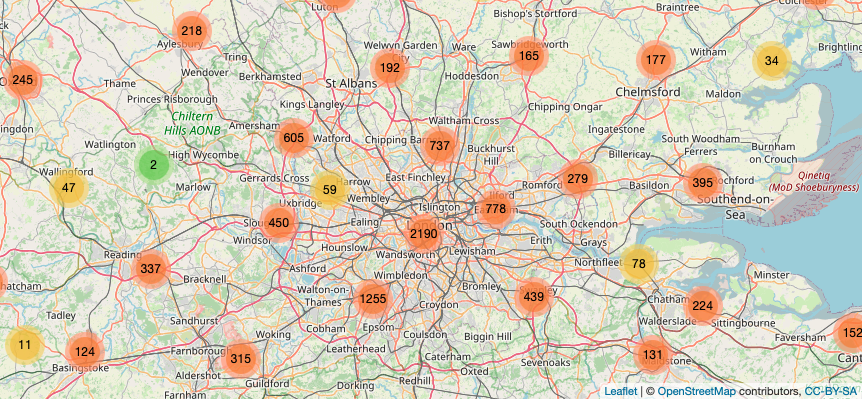

# Preamble

In [1]:
# Set R console language to English
Sys.setenv(LANG = "en")

The versions of packages used when this script originallay was developed in `R`version 4.12 are
- `plyr`: 1.8.6
- `dplyr`: 1.0.8
- `ggplot2`: 3.3.5
- `ggpubr`: 0.4.0
- `rgdal`: 1.5.28
- `geojsonio`: 0.9.4
- `lubridate`: 1.8.0
- `cowplot`: 1.1.1
- `leaflet`: 2.0.4.1
- `reshape`: 0.8.8
- `raster`: 3.5.15
- `RColorBrewer`: 1.1.2

In [2]:
# Load packages
library(plyr)
library(dplyr)
library(ggplot2)
library(ggpubr)
library(rgdal)
library(geojsonio)
library(lubridate)
library(cowplot)
library(leaflet)
library(reshape)
library(raster)
library(RColorBrewer)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:plyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘ggpubr’


The following object is masked from ‘package:plyr’:

    mutate


Loading required package: sp

Please note that rgdal will be retired by the end of 2023,
plan transition to sf/stars/terra functions using GDAL and PROJ
at your earliest convenience.

rgdal: version: 1.5-28, (SVN revision 1158)
Geospatial Data Abstraction Library extensions to R successfully loaded
Loaded GDAL runtime: GDAL 3.4.1, released 2021/12/27
Path to GDAL shared files: /Users/mathiasschindler/opt/anaconda3/envs/dataviz/share/gdal
GDAL binary built with GEOS: TRUE 
Loaded PROJ runtime: Rel. 8.2.1, January 1st, 2022, [PJ_VERSION: 821]
Path to PROJ shar

In [3]:
print("Versions installed on the computer running this script:")
paste("Package version of plyr:", packageVersion("plyr"))
paste("Package version of dplyr:", packageVersion("dplyr"))
paste("Package version of ggplot2:", packageVersion("ggplot2"))
paste("Package version of ggpubr:", packageVersion("ggpubr"))
paste("Package version of rgdal:", packageVersion("rgdal"))
paste("Package version of geojsonio:", packageVersion("geojsonio"))
paste("Package version of lubridate:", packageVersion("lubridate"))
paste("Package version of cowplot:", packageVersion("cowplot"))
paste("Package version of leaflet:", packageVersion("leaflet"))
paste("Package version of reshape:", packageVersion("reshape"))
paste("Package version of raster:", packageVersion("raster"))
paste("Package version of RColorBrewer:", packageVersion("RColorBrewer"))

[1] "Versions installed on the computer running this script:"


[1] "Package version of plyr: 1.8.6"

[1] "Package version of dplyr: 1.0.8"

[1] "Package version of ggplot2: 3.3.5"

[1] "Package version of ggpubr: 0.4.0"

[1] "Package version of rgdal: 1.5.28"

[1] "Package version of geojsonio: 0.9.4"

[1] "Package version of lubridate: 1.8.0"

[1] "Package version of cowplot: 1.1.1"

[1] "Package version of leaflet: 2.0.4.1"

[1] "Package version of reshape: 0.8.8"

[1] "Package version of raster: 3.5.15"

[1] "Package version of RColorBrewer: 1.1.2"

In [4]:
R.Version()

$platform
[1] "x86_64-apple-darwin13.4.0"

$arch
[1] "x86_64"

$os
[1] "darwin13.4.0"

$system
[1] "x86_64, darwin13.4.0"

$status
[1] ""

$major
[1] "4"

$minor
[1] "1.2"

$year
[1] "2021"

$month
[1] "11"

$day
[1] "01"

$`svn rev`
[1] "81115"

$language
[1] "R"

$version.string
[1] "R version 4.1.2 (2021-11-01)"

$nickname
[1] "Bird Hippie"

In [5]:
sessionInfo()

R version 4.1.2 (2021-11-01)
Platform: x86_64-apple-darwin13.4.0 (64-bit)
Running under: macOS Big Sur 10.16

Matrix products: default
BLAS/LAPACK: /Users/mathiasschindler/opt/anaconda3/envs/dataviz/lib/libopenblasp-r0.3.18.dylib

locale:
[1] C/UTF-8/C/C/C/C

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] RColorBrewer_1.1-2 raster_3.5-15      reshape_0.8.8      leaflet_2.0.4.1   
 [5] cowplot_1.1.1      lubridate_1.8.0    geojsonio_0.9.4    rgdal_1.5-28      
 [9] sp_1.4-6           ggpubr_0.4.0       ggplot2_3.3.5      dplyr_1.0.8       
[13] plyr_1.8.6        

loaded via a namespace (and not attached):
 [1] tidyr_1.2.0        jsonlite_1.8.0     carData_3.0-5      assertthat_0.2.1  
 [5] pillar_1.7.0       backports_1.4.1    lattice_0.20-45    glue_1.6.2        
 [9] uuid_1.0-3         digest_0.6.29      ggsignif_0.6.3     colorspace_2.0-3  
[13] htmltools_0.5.2    pkgconfig_2.0.3    httpcode_0.3.0     

# Load Data

Data documentation below from [https://www.gov.uk/guidance/about-the-price-paid-data#explanations-of-column-headers-in-the-ppd](https://www.gov.uk/guidance/about-the-price-paid-data#explanations-of-column-headers-in-the-ppd):

| Column        | Are           
| ------------- |:-------------:
| Transaction unique identifier | A reference number which is generated automatically recording each published sale. The number is unique and will change each time a sale is recorded.
| Price      | Sale price stated on the transfer deed.      
| Date of Transfer	 | Date when the sale was completed, as stated on the transfer deed    
| Postcode | This is the postcode used at the time of the original transaction. Note that postcodes can be reallocated and these changes are not reflected in the Price Paid Dataset.   
| Property Type      | D = Detached, S = Semi-Detached, T = Terraced, F = Flats/Maisonettes, O = Other. Note that: (i) we only record the above categories to describe property type, we do not separately identify bungalow, (ii) end-of-terrace properties are included in the Terraced category above , (iii) ‘Other’ is only valid where the transaction relates to a property type that is not covered by existing values, for example where a property comprises more than one large parcel of land      
| Old/New	 | Indicates the age of the property and applies to all price paid transactions, residential and non-residential. Y = a newly built property, N = an established residential building   
| Duration      | Relates to the tenure: F = Freehold, L= Leasehold etc. Note that HM Land Registry does not record leases of 7 years or less in the Price Paid Dataset.      
| PAON | Primary Addressable Object Name. Typically the house number or name   
| SAON      | Secondary Addressable Object Name. Where a property has been divided into separate units (for example, flats), the PAON (above) will identify the building and a SAON will be specified that identifies the separate unit/flat.      
| Street  |    
| Locality      |       
| Town/City      |       
| District | 
| County      |       
| PPD Category Type  | Indicates the type of Price Paid transaction. A = Standard Price Paid entry, includes single residential property sold for value. B = Additional Price Paid entry including transfers under a power of sale/repossessions, buy-to-lets (where they can be identified by a Mortgage), transfers to non-private individuals and sales where the property type is classed as ‘Other’. Note that category B does not separately identify the transaction types stated. HM Land Registry has been collecting information on Category A transactions from January 1995. Category B transactions were identified from October 2013.
| Record Status - monthly file only      | Indicates additions, changes and deletions to the records.(see guide below). A = Addition, C = Change, D = Delete. Note that where a transaction changes category type due to misallocation (as above) it will be deleted from the original category type and added to the correct category with a new transaction unique identifier.      

In [6]:
# Set path
path = "/Users/mathiasschindler/Library/Mobile Documents/com~apple~CloudDocs/BSE/_T2-Data Viz/FinalProject/data"

In [7]:
# Full dataset
# file = paste(path, "pp-complete.csv", sep = "/") 
# df = read.csv(file)
# head(df, 5)

# Subsample - when developing code / check code runs
file = paste(path, "ppdata_subs.csv", sep = "/") 
df = read.csv(file, na.strings=c("", " ", "NA"))
head(df, 5)

,transaction_unique_identifier,price,date_of_transfer,postcode,property_type,old_new,duration,PAON,SAON,street,locality,town_city,district,county,PPD_category_type,record_status
,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,{24EDE89B-CC0D-4990-9CBB-08F4739C4674},249950,2005-11-28 00:00,M27 0AG,T,N,F,304,NA,WORSLEY ROAD,SWINTON,MANCHESTER,SALFORD,GREATER MANCHESTER,A,A
2,{4D84F030-6E32-4CA5-8F90-7C2EA2B517D6},290000,2005-06-10 00:00,B73 5NX,S,N,F,66,NA,EASTERN ROAD,SUTTON COLDFIELD,SUTTON COLDFIELD,BIRMINGHAM,WEST MIDLANDS,A,A
3,{2A289EA0-AB7A-CDC8-E050-A8C063054829},140000,2002-05-30 00:00,LL75 8BQ,D,N,F,BANGOR HOUSE,NA,NA,NA,PENTRAETH,ISLE OF ANGLESEY,ISLE OF ANGLESEY,A,A
4,{6A9B863E-623E-4D5B-9DF9-F17C96F58EB1},150000,2005-08-05 00:00,L31 4JW,S,N,L,13,NA,BLACKHURST ROAD,LYDIATE,LIVERPOOL,SEFTON,MERSEYSIDE,A,A
5,{BF469C5B-4F9A-4A1C-9B00-BB4F44F66BB2},116000,2004-10-19 00:00,IP3 0NH,S,N,F,81,NA,LEVINGTON ROAD,IPSWICH,IPSWICH,IPSWICH,SUFFOLK,A,A


# C. Temporal Analysis

## C1. Housing Price Development in 2015

<ins>Instructions</ins>
<br/>
"*Examine the house prices for 2015. How do these change over time? Do property prices seem to increase or decrease throughout the year?*"

In [8]:
# Suppress Warnings
defaultW <- getOption("warn") 
options(warn = -1) 

First, in order for `ggplot` to plot date variables along the x-axis the variable `date_of_transfer` is set to the date format using the base `R` function `as.Date` in combination with `ymd_hm` function from `lubridate`.

In [9]:
# Use lubridates function to remove time from 'date_of_transfer'
df$date_of_transfer <- as.Date(ymd_hm(df$date_of_transfer))
head(df)

# Any NaNs?
paste("# NaNs for date:", sum(is.na(df$date_of_transfer)) )

,transaction_unique_identifier,price,date_of_transfer,postcode,property_type,old_new,duration,PAON,SAON,street,locality,town_city,district,county,PPD_category_type,record_status
,<chr>,<int>,<date>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,{24EDE89B-CC0D-4990-9CBB-08F4739C4674},249950,2005-11-28,M27 0AG,T,N,F,304,NA,WORSLEY ROAD,SWINTON,MANCHESTER,SALFORD,GREATER MANCHESTER,A,A
2,{4D84F030-6E32-4CA5-8F90-7C2EA2B517D6},290000,2005-06-10,B73 5NX,S,N,F,66,NA,EASTERN ROAD,SUTTON COLDFIELD,SUTTON COLDFIELD,BIRMINGHAM,WEST MIDLANDS,A,A
3,{2A289EA0-AB7A-CDC8-E050-A8C063054829},140000,2002-05-30,LL75 8BQ,D,N,F,BANGOR HOUSE,NA,NA,NA,PENTRAETH,ISLE OF ANGLESEY,ISLE OF ANGLESEY,A,A
4,{6A9B863E-623E-4D5B-9DF9-F17C96F58EB1},150000,2005-08-05,L31 4JW,S,N,L,13,NA,BLACKHURST ROAD,LYDIATE,LIVERPOOL,SEFTON,MERSEYSIDE,A,A
5,{BF469C5B-4F9A-4A1C-9B00-BB4F44F66BB2},116000,2004-10-19,IP3 0NH,S,N,F,81,NA,LEVINGTON ROAD,IPSWICH,IPSWICH,IPSWICH,SUFFOLK,A,A
6,{2A0727B5-91FF-43D0-9E88-5A798158BFDE},77500,2003-03-21,DE72 3FX,S,N,F,6,NA,CASTLE CLOSE,BORROWASH,DERBY,EREWASH,DERBYSHIRE,A,A


[1] "# NaNs for date: 0"

### C1.1 UK House Prices, 1995-2018

To first show the whole picture, I investigate the the development of UK house prices for the whole period in the dataset, i.e. 1995-2018, in Figure C1a. Here there is a large spike at the end of 2014. In order to alleviate spikes, the log-transformed housing prices are shown in Figure C1b which also includes a linear fitted line (dashed blue). Fluctuations are still apparent but an underlying trend of increasing house prices is observed from Figure C1b.

In [26]:
# Set global plot options
options(repr.plot.width=16, repr.plot.height=7)
global_size = 14

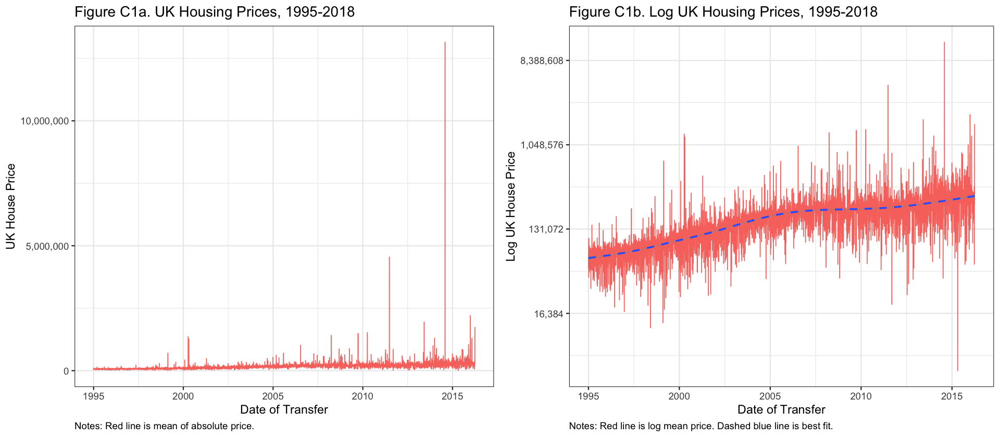

In [32]:
# Housing prices over time
require(scales)

# Basic plot skeleton
price_plot <- df %>%
    group_by(date_of_transfer) %>%
    summarise_at(vars(price), list(price_mean = mean, price_sd = sd)) %>%
    arrange(date_of_transfer) %>%
    ggplot(aes(x = date_of_transfer, 
               y = price_mean)) +
    geom_line(aes(color = "red")) +
    xlab("Date of Transfer") +
    ylab("UK House Price") +
    ggtitle("Figure C1a. UK Housing Prices, 1995-2018") +
    theme_bw(base_size = global_size) +
    theme(legend.position = "none", plot.caption = element_text(hjust = 0)) 

# Absolute house prices
abs_prices <- price_plot + 
    scale_y_continuous(labels = comma) +
    labs(caption = "Notes: Red line is mean of absolute price.")

# Log house prices
log_prices <- price_plot + 
    geom_smooth(formula = y ~ s(x, bs = "cs"), method = 'gam', linetype = "dashed") +
    scale_y_continuous(trans = "log2", labels = comma) +
    ylab("Log UK House Price") +
    ggtitle("Figure C1b. Log UK Housing Prices, 1995-2018") +
    labs(caption = "Notes: Red line is log mean price. Dashed blue line is best fit.") 

# Combine plots
plot_grid(abs_prices, log_prices, ncol = 2, rel_heights = c(1, .1))

### C1.2 UK House Prices, 2015

Below the observed window is zoomed in to include only housing prices in the year 2015. Property prices fluctuate put seem to have a slight increasing trend towards the end the year 2015. There is a large spike at the end of the year and smaller spikes in the middle (Juli to August). The underlying trend as visualized by the smoothed line does not indicate an increasing trend throughout the year, however.

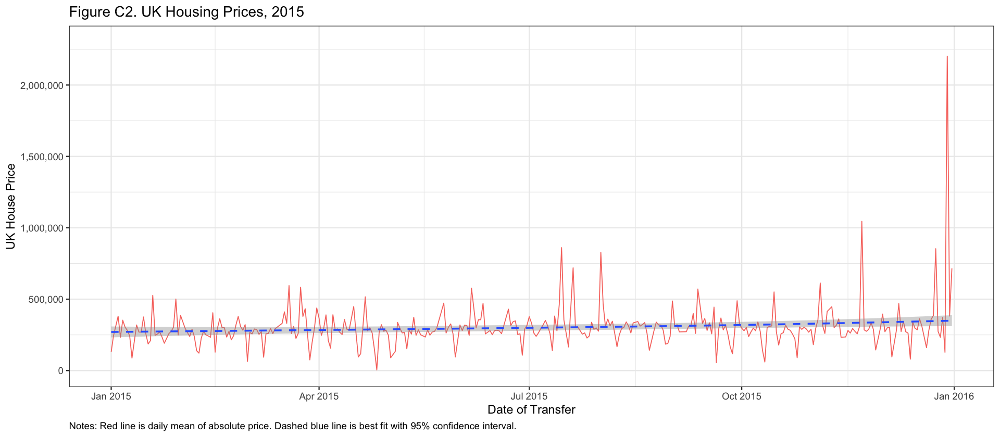

In [34]:
# Housing prices for 2015
price_p15 <- price_plot + 
    scale_x_date(limits = as.Date(c("2015-01-01","2015-12-31"))) +
    geom_smooth(formula = y ~ s(x, bs = "cs"), method = 'gam', linetype = "dashed") +
    ggtitle("Figure C2. UK Housing Prices, 2015") +
    labs(caption = "Notes: Red line is daily mean of absolute price. Dashed blue line is best fit with 95% confidence interval.") +
    scale_y_continuous(limits = c(0, 2300000), 
                       labels = comma) 
suppressWarnings(print(price_p15))

## C2. Property Price Seasonality

<ins>Instructions</ins>
<br/>
"*Is there a significant relationship between the price of a property and the time of year it is sold? Does this vary with type of property?*"

This exercise analyzes relationsship between time of year sale and house price. Hence it will be analyzed if the same observed phenomenon from Figure C2, i.e. spikes in Summer months and towards year-end, can be generalized to other years. Therefore the same plot as Figure C2 is extended by plotting all the years 1995-2018 separately as show in Figure C2.1.

### Custom Function

Because the same type of plot will be repeated multiple times, I have created my own custom function `prices_plots` below. This function can then simply be called so as to not writing the same code multiple times.

In [42]:
# Define function
prices_plots <- function(fignum, dataf, years, proptype) {
    # Run loop for subplots
    for (k in years) {
        # Set iterable plotnames and time periods
        pname <- paste("price_p", k, sep = "")
        startdate <- paste(k, "-01-01", sep ="")
        enddate <- paste(k, "-12-31", sep ="")

        # Stor y-limits
        dataf$year <- year(dataf$date_of_transfer)
        ylimits <- dataf %>% subset(as.numeric(year) == k) %>% summarise_at(vars(price), list(Q1=~quantile(., probs = 0.10), Q3=~quantile(., probs = 0.90)))
        ymin <- as.integer(ylimits[1])
        ymax <- as.integer(ylimits[2])

        # Save subplot as plot
        plot <- dataf %>%
            group_by(date_of_transfer) %>%
            summarise_at(vars(price), list(price_mean = mean, price_sd = sd)) %>%
            arrange(date_of_transfer) %>%
            ggplot(aes(x = date_of_transfer, 
                       y = price_mean)) +
            geom_line(aes(color = "red")) +
            geom_smooth(formula = y ~ s(x, bs = "cs"), method = 'gam', linetype = "dashed") +
            xlab("Date of Transfer") +
            ylab("UK House Price") +
            theme_bw(base_size = global_size) +
            theme(legend.position = "none", plot.caption = element_text(hjust = 0)) +
            scale_x_date(limits = as.Date(c(startdate, enddate))) +
            ggtitle(paste(k)) +
            scale_y_continuous(limits = c(ymin, ymax),
                                labels = comma)

        # Set iterrated plots as plot name
        assign(pname, plot)
    }

    # Combine plots
    grid <- plot_grid(price_p2016, price_p2015, price_p2014, price_p2013, 
              price_p2012, price_p2011,
              price_p2010, price_p2009, price_p2008, price_p2007, price_p2006, price_p2005,
              price_p2004, price_p2003, price_p2002, price_p2001, price_p2000, price_p1999,
              price_p1998, price_p1997, price_p1996, price_p1995,
              ncol = 3, nrow = 7)
    annotate_figure(grid, top = text_grob(paste("Figure", fignum, "UK Housing Prices for", proptype ,"Property Type"), 
                                          face = "bold", 
                                          size = 16)) 
}

### C2.1 Visualizing Relationsship over Years

By looking at the price development for different years, it is possible to investigate whether the slightly positive relationsship between prices and months in a given year holds for different years. 2016 only has observations until April so cannot be used to draw conclusions. 
<br>
In general, we *do* see an increasing trend of housing prices in the majority of the years, as visualized by the smoothed blue dashed line. This would lead us to conclude that there *does* seem to a relationsship between the price of a property and the time of year sold. However, we do not generally observe the same spikes in summer months and year-end as in Figure C2.
<br> 
Section C2.2 investigates if the relationsship varies with type of property.

In [15]:
# Suppress Warnings
defaultW <- getOption("warn") 
options(warn = -1) 

In [16]:
# List years in dataset
table(format(df$date_of_transfer, format="%Y"))


  1995   1996   1997   1998   1999   2000   2001   2002   2003   2004   2005 
 94156 114388 128698 123871 140998 133196 146339 159571 147964 149031 125395 
  2006   2007   2008   2009   2010   2011   2012   2013   2014   2015   2016 
156617 149733  76505  73372  77871  78181  78835  96052 115512 116191  17524 

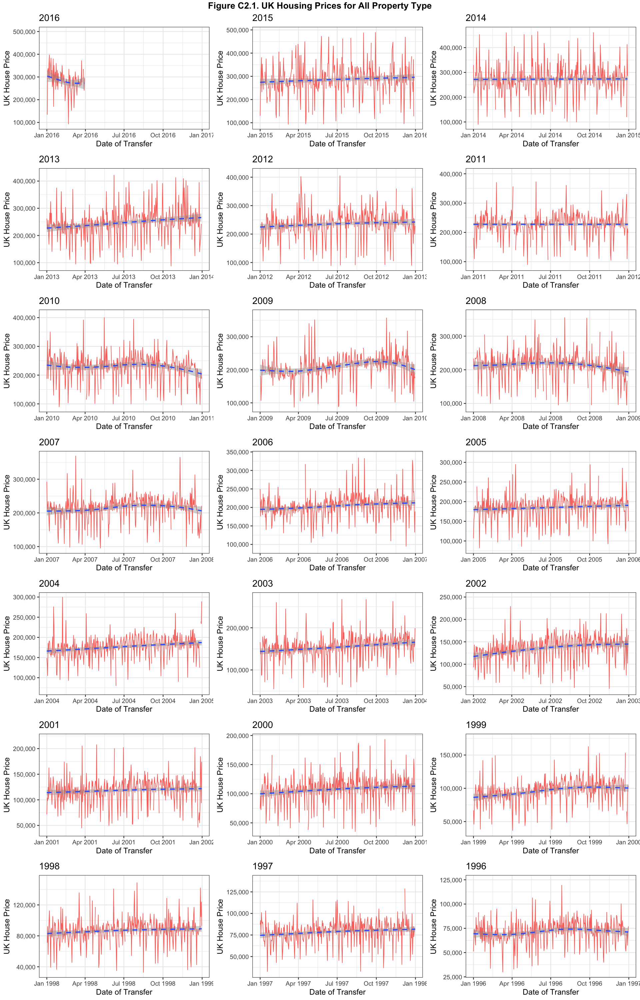

In [43]:
options(repr.plot.width=16, repr.plot.height=25)

# Years to plot over
years = c(1995:2016)

# Custom plot function
prices_plots("C2.1.", df, years, "All")

### C2.2 Relationsship For Different Property Types

This section analyzes whether the slight increase in property price and time of year it is sold varies across property types. To analyze this the same plot as Figure C2.1 is repeated for subsamples containing only one given property type at a time. The considered property types are:
- Detached (`D`): Illustrated in Figure C2.2a
- Semi-Detached (`S`): Illustrated in Figure C2.2b
- Flats (`F`): Illustrated in Figure C2.2c
- Terraced (`T`): Illustrated in Figure C2.2d
- Others (`O`): Illustrated in Figure C2.2e

From Figure C2.2.a, for detached properties there is not a noticeable upwards trend in housing prices in the later years. However, from 1996-2006 a slightly increasing trend in housing prices can be observed. This same phenomenon also holds for semi-detached properties and flats. For terraced properties there is an increasing trend in property prices especially in the years from 2003-2015. This is also the largest category as shown in the next code cell below. It seems therefore that in the increase in house prices in the early period of the data is driven by detached, semi-detached and flats property types and in later years by terraced buildings. It should be noted that Figure 2.2e plots the "other" property type but the category is too small to draw conclusions from, the figure is only added for completion.
<br> 
The trend inside of the year, i.e. whether time-of-year-sale time is correlated with price is not so clear-cut between property types. Figure 2.1 that houses sold later in the year generally fetched higher prices than those sold in the beginning of the year. This is not necesarrily the same for different property types. E.g. detached houses in 2012 had the highest housing prices in the summer months and in 2008, the price declined throughout the year (presumably due to the financial crisis). Semi-detached properties in 2010, 2011 and 2013 generally peaked in August to October instead of in December. This is the same for terraced properties 2009 and 2013.
<br>
So while we observe the drivers of the increase in UK house prices we can actually confirm that the relationship between price and time of the year sale *does* vary with property type.

In [50]:
# Value counts for property type
format(table(df$property_type), big.mark = ",")

D         F         O         S         T 
"574,488" "451,116" "  4,222" "695,921" "774,253"

In [19]:
# Save subdatasets for each property type
df_detach <- subset(df, df$property_type == "D")
df_sdetach <- subset(df, df$property_type == "S")
df_flat <- subset(df, df$property_type == "F")
df_terr <- subset(df, df$property_type == "T")
df_oth <- subset(df, df$property_type == "O")

#### C2.2.1 Detached Property Type

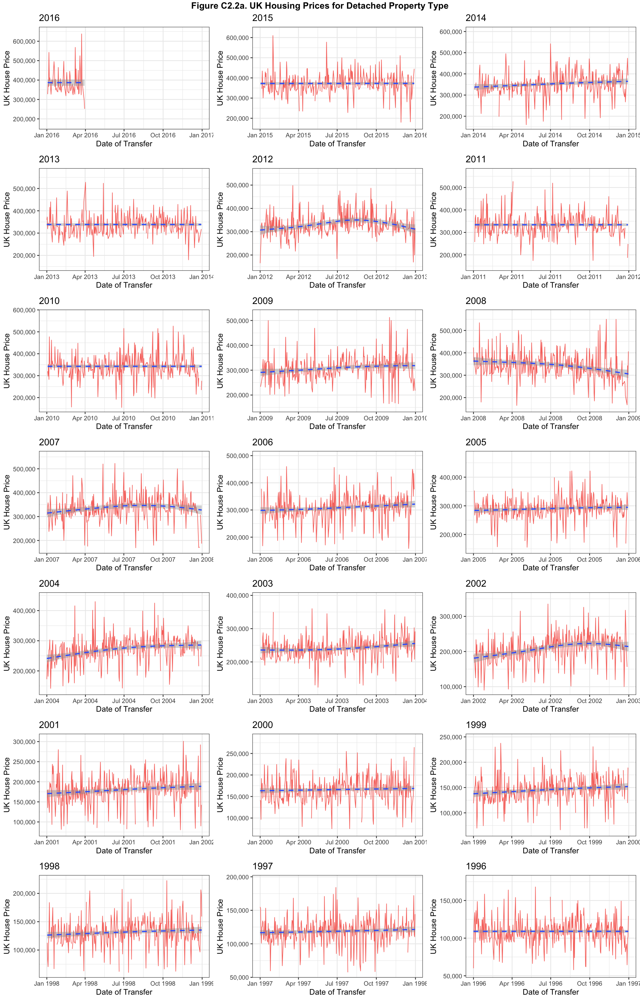

In [44]:
# Years to plot over
years = c(1995:2016)

# Custom plot function
prices_plots("C2.2a.", df_detach, years, "Detached")

#### C2.2.2 Semi-Detached Property Type

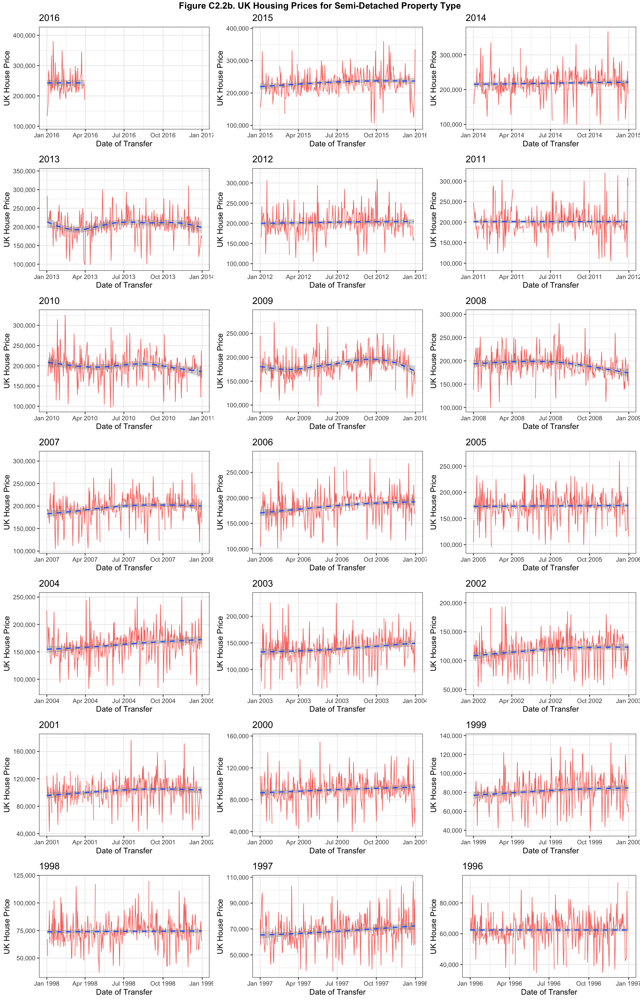

In [45]:
options(repr.plot.width=16, repr.plot.height=25)

# Years to plot over
years = c(1995:2016)

# Custom plot function
prices_plots("C2.2b.", df_sdetach, years, "Semi-Detached")

#### C2.2.3 Flats

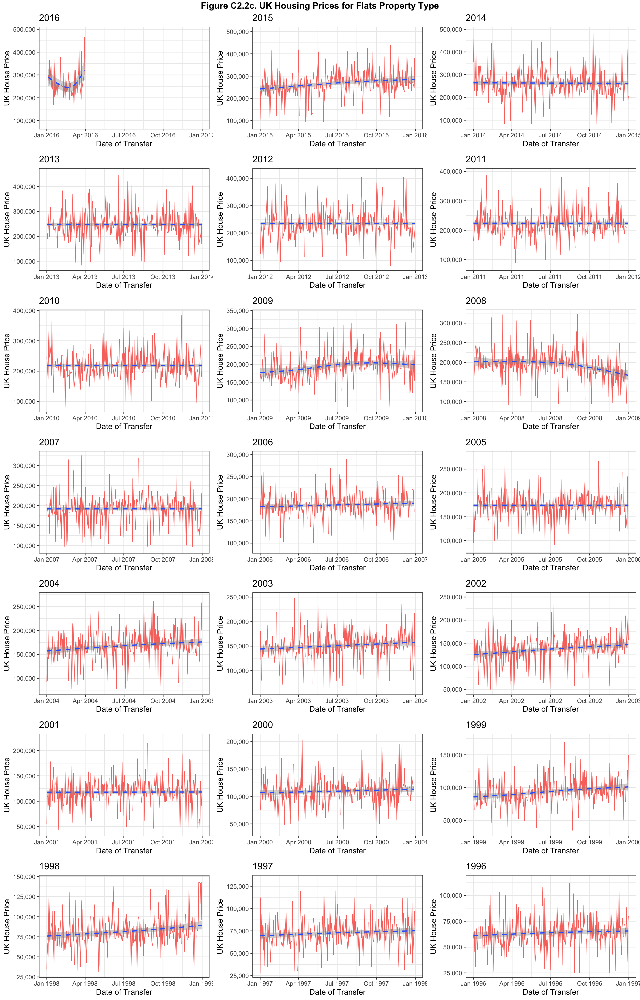

In [46]:
options(repr.plot.width=16, repr.plot.height=25)

# Years to plot over
years = c(1995:2016)

# Custom plot function
prices_plots("C2.2c.", df_flat, years, "Flats")

#### C2.2.4 Terraced

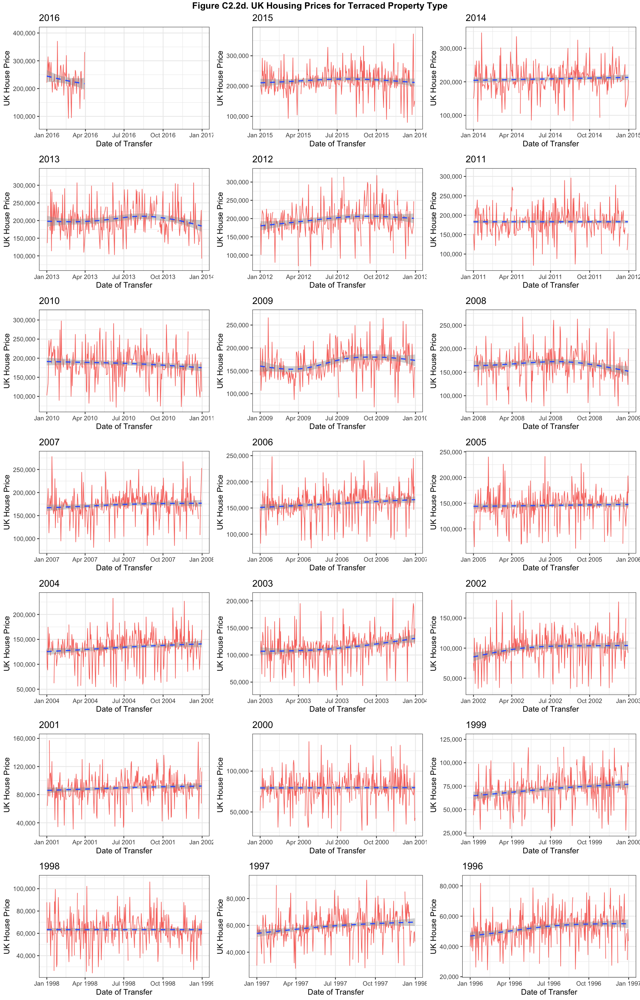

In [47]:
options(repr.plot.width=16, repr.plot.height=25)

# Years to plot over
years = c(1995:2016)

# Custom plot function
prices_plots("C2.2d.", df_terr, years, "Terraced")

#### C2.2.5 Other

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



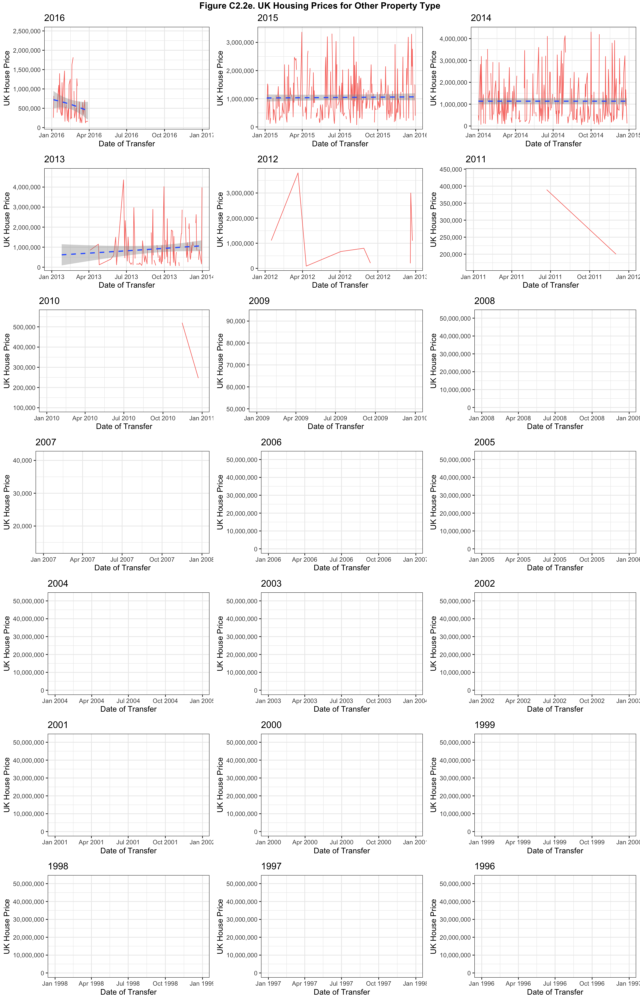

In [48]:
options(repr.plot.width=16, repr.plot.height=25)

# Years to plot over
years = c(1995:2016)

# Custom plot function
prices_plots("C2.2e.", df_oth, years, "Other")